# deepBreaks applications
## Modeling maximum wavelength absorption based on opsin gene amino-acid sequence  
In this study we are trying to use 175 amino-acid sequences to train predictive models for predicting a phenotype which is the the maximum wavelength absobption.  
After that, we use the top 3 models to study their feature importances and merge their results. We cover all three steps of preprocessing, modelling, and interpretaion of the models. Finally we vizualize the results of the models and prioritize the most imposrtant sites of the sequences.  
![alt text](../img/lite_mar/LITE_Mar.png)

In [12]:
# importing deepBreaks libraries 
from deepBreaks import preprocessing as prp
from deepBreaks import visualization as viz
from deepBreaks import models as ml
import os
import datetime
import warnings

In [13]:
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

In [14]:
# defining user params, file pathes, analysis type

# path to sequences
seqFileName = 'rod_fmt.fasta' 

# path to metadata
metaDataFileName = 'rod_meta.tsv' 

# name of the phenotype
mt = 'Lambda_Max'

# type of the sequences
seq_type = 'amino-acid'

# type of the analysis if it is a classification model, then we put cl instead of reg
anaType = 'reg' 
sampleFrac=1

In [15]:
# making a unique directory for saving the reports of the analysis
print('direcory preparation')
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seqFile = seqFileName.split('.')[0]
report_dir = str(seqFile +'_' + mt + '_' + dt_label)
os.makedirs(report_dir)

direcory preparation


In [16]:
%%time
print('reading meta-data')
# importing metadata
metaData = prp.read_data(metaDataFileName, seq_type = None, is_main=False)
print('metaData:', metaData.shape)

# importing sequences data
print('reading fasta file')
df = prp.read_data(seqFileName, seq_type = seq_type, is_main=True)

positions = df.shape[1]
print('Done')
print('Shape of data is: ', df.shape)

reading meta-data
metaData: (388, 4)
reading fasta file
Done
Shape of data is:  (388, 425)
CPU times: total: 109 ms
Wall time: 100 ms


**Attention**: metadata and sequences data should have the names as their row names and for each sequence their must be a value in the meta data file.

In [17]:
print('metadata looks like this:')
metaData.head()

metadata looks like this:


,Lambda_Max,Species,Opsin_Family,Accession
S1,502.0,Neoniphon_sammara,Rh1,U57536.1
S2,502.0,Neoniphon_argenteus,Rh1,U57540.1
S3,481.0,Neoniphon_aurolineatus,Rh1,U57541.1
S4,494.0,Sargocentron_punctatissimum,Rh1,U57543.1
S5,494.0,Sargocentron_microstoma,Rh1,U57542.1


In [18]:
print('sequence data looks like this:')
df.head()

sequence data looks like this:


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p416,p417,p418,p419,p420,p421,p422,p423,p424,p425
S1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M,N,...,NaN,NaN,NaN,NaN,S,S,V,S,P,A
S2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,S,S,V,S,P,A
S4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,S,S,V,S,P,A
S5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,S,S,V,S,P,A
S6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M,N,...,NaN,NaN,NaN,NaN,S,S,V,S,P,A


### Preprocessing
In this step, we do all these steps:
1. dropping columns with a number of missing values above a certain threshold  
2. dropping zero entropy columns  
3. imputing missing values with the mode of that column  
4. replacing cases with a frequency below a threshold (default 1.5%) with the mode of that column
5. dropping zero entropy columns
6. use statistical tests (each position against the phenotype) and drop columns with p-values below a threshold (default 0.25)
7. one-hot encode the remaining columns
8. calculate the pair-wise distance matrix for all of the columns
9. use the distance matrix for DBSCAN and cluster the correlated positions together
10. keep only one column (closes to center of each cluster) for each group and drop the rest from the training data set

In [19]:
%%time
# taking care of missing data
print('Shape of data before missing/constant care: ', df.shape)
df = prp.missing_constant_care(df)
print('Shape of data after missing/constant care: ', df.shape)

Shape of data before missing/constant care:  (388, 425)
Shape of data after missing/constant care:  (388, 284)
CPU times: total: 62.5 ms
Wall time: 64 ms


In [20]:
%%time
# taking care of ultra-rare cases
print('Shape of data before imbalanced care: ', df.shape)
df = prp.imb_care(dat=df, imbalance_threshold=0.025)
print('Shape of data after imbalanced care: ', df.shape)

Shape of data before imbalanced care:  (388, 284)
Shape of data after imbalanced care:  (388, 264)
CPU times: total: 547 ms
Wall time: 550 ms


In [21]:
%%time
# you may want to perform your analysis only on a random sample of the positions.
# Here you can have a random sample of your main data set.
print('number of columns of main data befor: ', df.shape[1])
df = prp.col_sampler(dat=df, sample_frac=sampleFrac)
print('number of columns of main data after: ', df.shape[1])

number of columns of main data befor:  264
number of columns of main data after:  264
CPU times: total: 0 ns
Wall time: 1 ms


In [22]:
%%time
# Use statistical tests to drop redundant features.
print('number of columns of main data befor: ', df.shape[1])
df_cleaned = prp.redundant_drop(dat=df, meta_dat=metaData,
                        feature=mt, model_type=anaType,
                        threshold=0.25,
                        report_dir=report_dir)
print('number of columns of main data after: ', df_cleaned.shape[1])

number of columns of main data befor:  264
number of columns of main data after:  257
CPU times: total: 500 ms
Wall time: 522 ms


In [23]:
%%time
print('one-hot encoding the dataset')
df_cleaned = prp.get_dummies(dat=df_cleaned, drop_first=True)

one-hot encoding the dataset
CPU times: total: 125 ms
Wall time: 117 ms


In [24]:
%%time
print('calculating the distance matrix')
cr = prp.distance_calc(dat=df_cleaned,
                       dist_method='correlation',
                       report_dir=report_dir)
print(cr.shape)

calculating the distance matrix
(634, 634)
CPU times: total: 469 ms
Wall time: 480 ms


In [25]:
print('The distance matrix looks like this.\n The values are between 0 (exact the same) and 1 (non-related).')
cr.head()

The distance matrix looks like this.
 The values are between 0 (exact the same) and 1 (non-related).


,p31_G,p31_L,p31_M,p32_KTLRI,p32_N,p32_S,p32_V,p47_ST,p48_GNQIL,p48_H,...,p135_G,p166_G,p166_SC,p166_Y,p192_K,p228_HQDASTNGVLMFYCWI,p302_D,p302_E,p360_S,p362_Y
p31_G,0.000000,0.883081,0.675781,0.936716,0.946042,0.838985,0.887862,0.954639,0.950178,0.018758,...,0.648706,0.220205,0.954639,0.332382,0.000000,0.934984,0.946042,0.788113,0.835664,0.910812
p31_L,0.883081,0.000000,0.512620,0.860671,0.957646,0.891497,0.831430,0.748878,0.782632,0.880846,...,0.664881,0.853590,0.748878,0.921943,0.883081,0.934956,0.577259,0.711493,0.701682,0.990497
p31_M,0.675781,0.512620,0.000000,0.973913,0.861529,0.599690,0.654130,0.909611,0.912766,0.669583,...,0.890683,0.633549,0.909611,0.783546,0.675781,0.776135,0.803028,0.378936,0.958591,0.814756
p32_KTLRI,0.936716,0.860671,0.973913,0.000000,0.956097,0.606971,0.908760,0.283212,0.764596,0.935507,...,0.868905,0.704506,0.283212,0.957751,0.936716,0.944873,0.531594,0.899678,0.915269,0.927432
p32_N,0.946042,0.957646,0.861529,0.956097,0.000000,0.664889,0.922205,0.968531,0.965436,0.945010,...,0.756291,0.930805,0.968531,0.963977,0.946042,0.954896,0.962567,0.853004,0.885993,0.395010


In [26]:
%%time
print('finding colinear groups')
dc_df = prp.db_grouped(dat=cr,
                       report_dir=report_dir,
                       threshold=.25, needs_pivot=False)

finding colinear groups
CPU times: total: 656 ms
Wall time: 895 ms


In [27]:
print('The result of the last step is a dataframe with two columns,\
1)feature and 2)group.\nif there are no groups, it will be an empty dataframe')
dc_df.head()

The result of the last step is a dataframe with two columns,1)feature and 2)group.
if there are no groups, it will be an empty dataframe


,feature,group
0,p31_G,g0
3,p32_KTLRI,g1
4,p32_N,g2
5,p32_S,g3
6,p32_V,g3


Then, we pass the above calculated groupes into the *group_feature* function. This function finds the distance of all the group members to the center of the group (median). The result will be a dictionary of columns like this:  
\
{\
group1_representativ:[member1, member2,...],  
group2_representativ:[member1, member2,...],...  
}

In [28]:
%%time
print('grouping features')
dc = prp.group_features(dat=df_cleaned,
                        group_dat=dc_df,
                        report_dir=report_dir)

grouping features
CPU times: total: 93.8 ms
Wall time: 86 ms


In [29]:
print('dropping correlated features')
print('Shape of data before collinearity care: ', df_cleaned.shape)
df_cleaned = prp.cor_remove(df_cleaned, dc)
print('Shape of data after collinearity care: ', df_cleaned.shape)

dropping correlated features
Shape of data before collinearity care:  (388, 634)
Shape of data after collinearity care:  (388, 167)


In [30]:
# merge with metadata
df = df.merge(metaData[mt], left_index=True, right_index=True)
df_cleaned = df_cleaned.merge(metaData[mt], left_index=True, right_index=True)

## Modelling
In this step, we try to fit multiple models to the training dataset and rank them based on their performance. By default, we select the top 3 three models for further analysis.  
During this step, deepBreaks creates a CSV file containing all the fitted models with their performance metrics. These metrics are based on an average of 10-fold cross-validation.

In [31]:
%%time
models_to_select = 3 # number of top models to select
top_models, train_cols, model_names = ml.fit_models(dat = df_cleaned,
                                                    meta_var=mt,
                                                    model_type=anaType, 
                                                    models_to_select=models_to_select,
                                                    report_dir=report_dir)

,Description,Value
0,session_id,123
1,Target,Lambda_Max
2,Original Data,"(388, 168)"
3,Missing Values,False
4,Numeric Features,167
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(271, 125)"


CPU times: total: 9.14 s
Wall time: 19.9 s


## Interpretation 
In this step, we use the training data set, positions, and the top models to report the most discriminative positions in the sequences associated with the phenotype.  
we report the feature importances for all top models separately and make a box plot (regression) or stacked bar plot (classification) for the top 4 positions.

Extra Trees RegressorDone
Extra Trees Regressor  Done
Decision Tree RegressorDone
Decision Tree Regressor  Done
Random Forest RegressorDone
Random Forest Regressor  Done


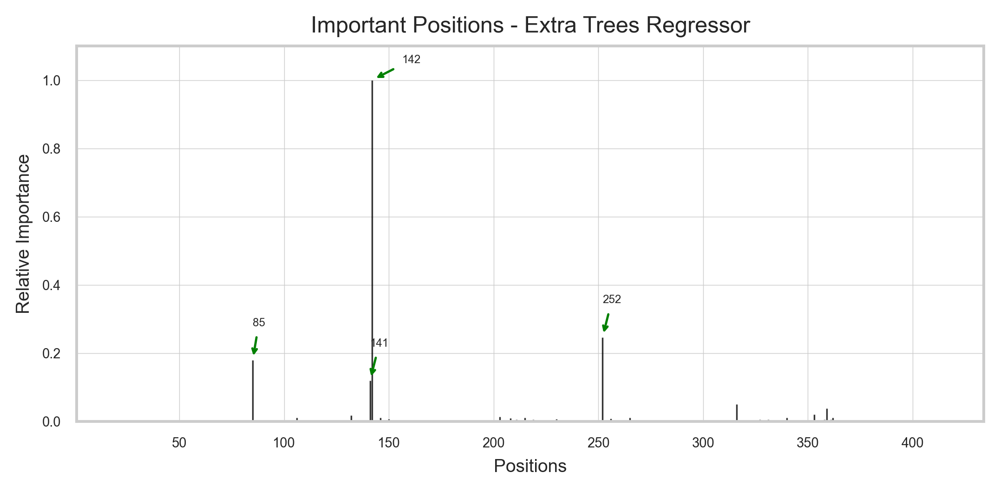

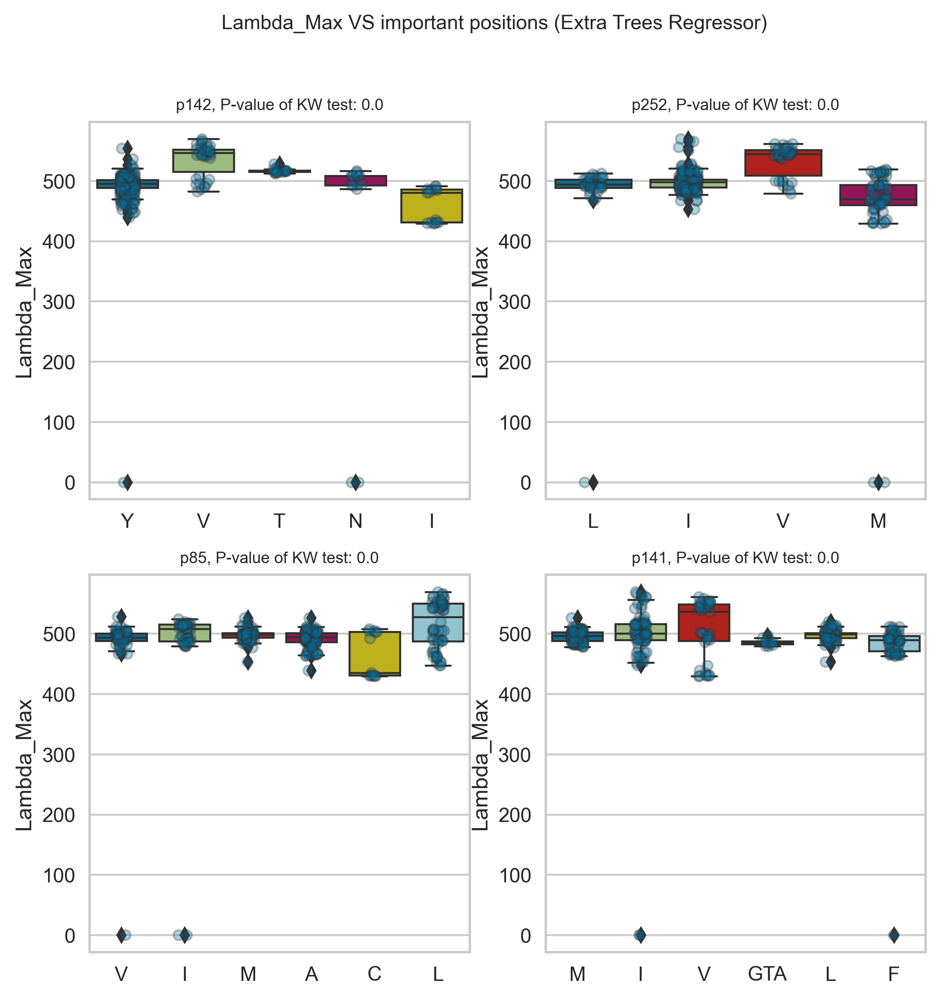

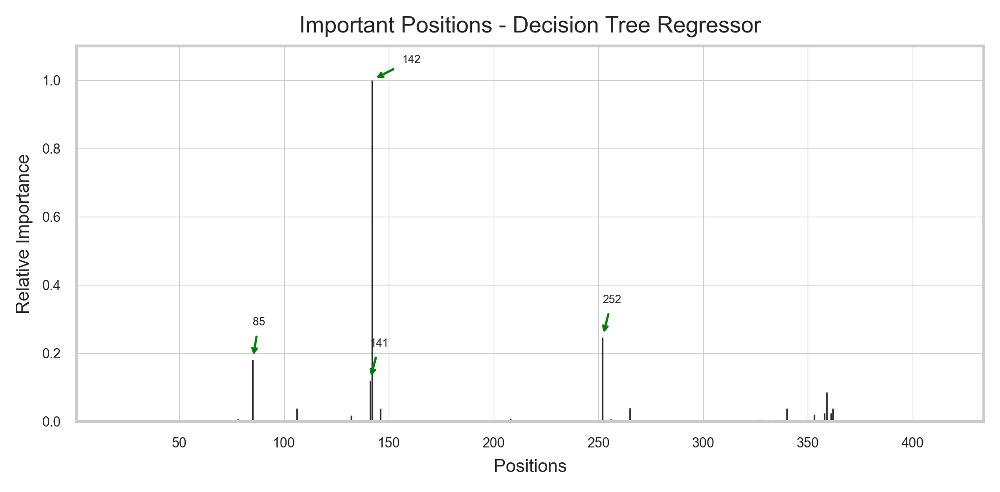

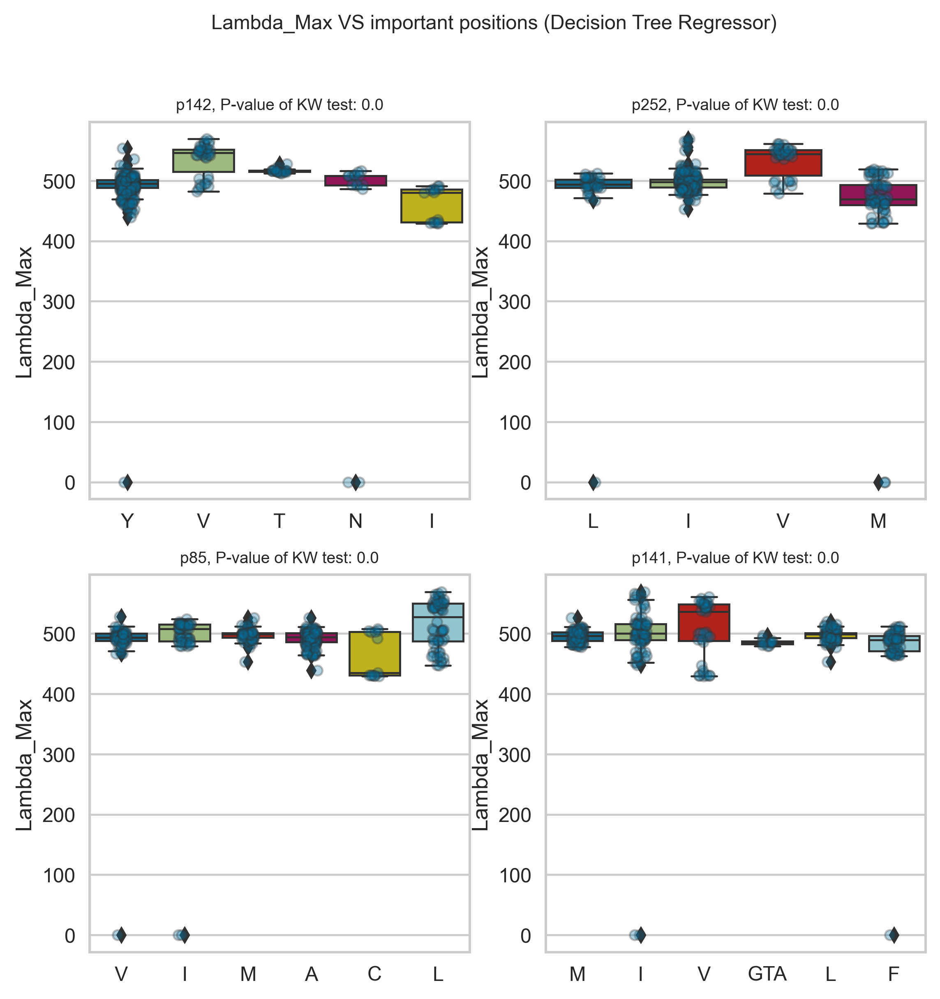

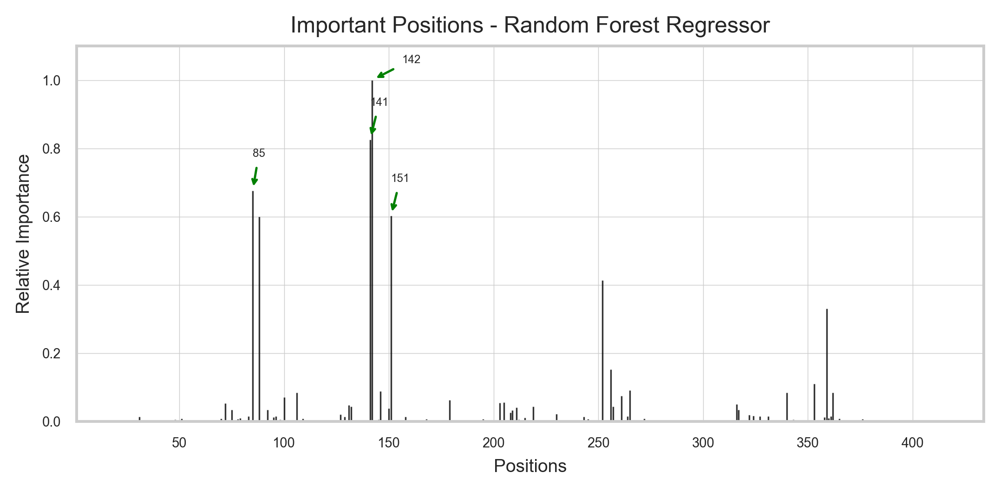

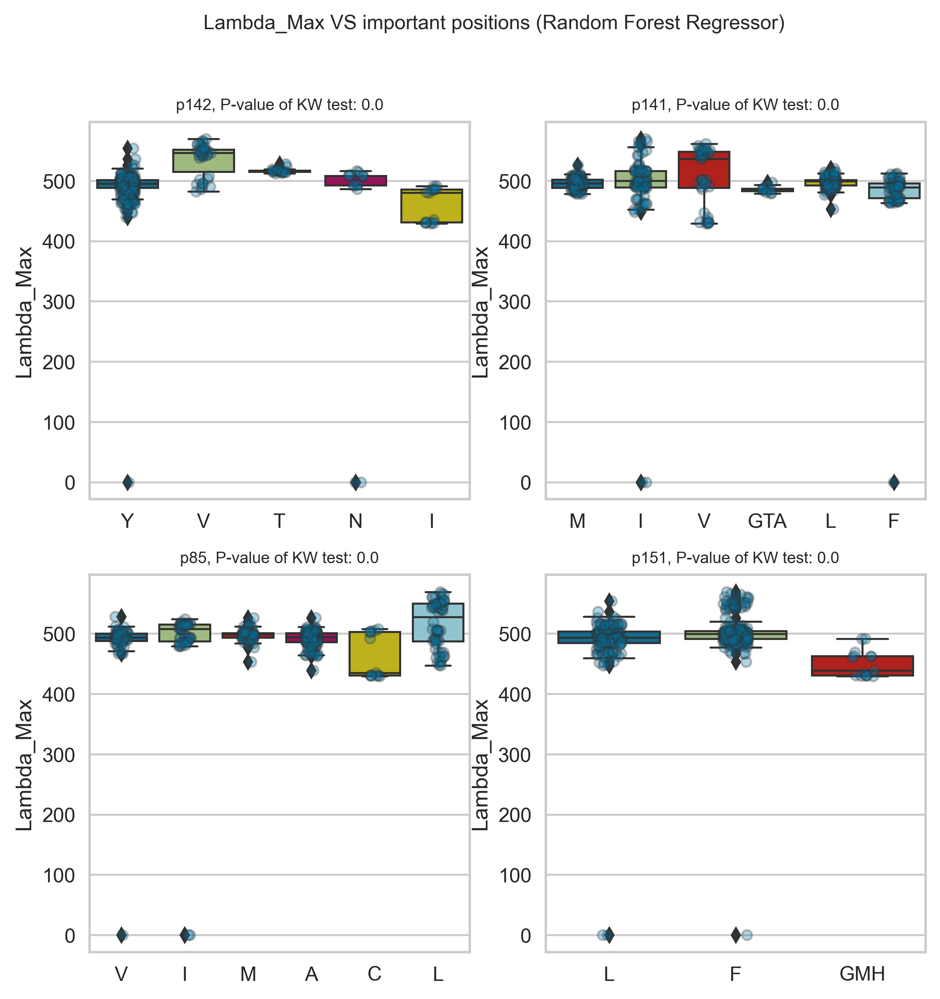

In [32]:
for i in range(models_to_select):
    # calculate the featre importances
    imp = ml.fimp_single(trained_model=top_models[i], model_name=model_names[i],
                         train_cols=train_cols, grouped_features=dc,
                         n_positions=positions, report_dir=report_dir)
    # visualize the lollipop plot for features based on each model
    viz.dp_plot(dat = imp, model_name= model_names[i],imp_col='standard_value', report_dir=report_dir)
    
    # visualize the boxplots for features based on each model
    viz.plot_imp_model(dat=df, trained_model=top_models[i],
                       model_name=model_names[i],
                       train_cols=train_cols, grouped_features=dc,
                       meta_var=mt, n_positions=positions,
                       model_type=anaType, report_dir=report_dir)

meanDone


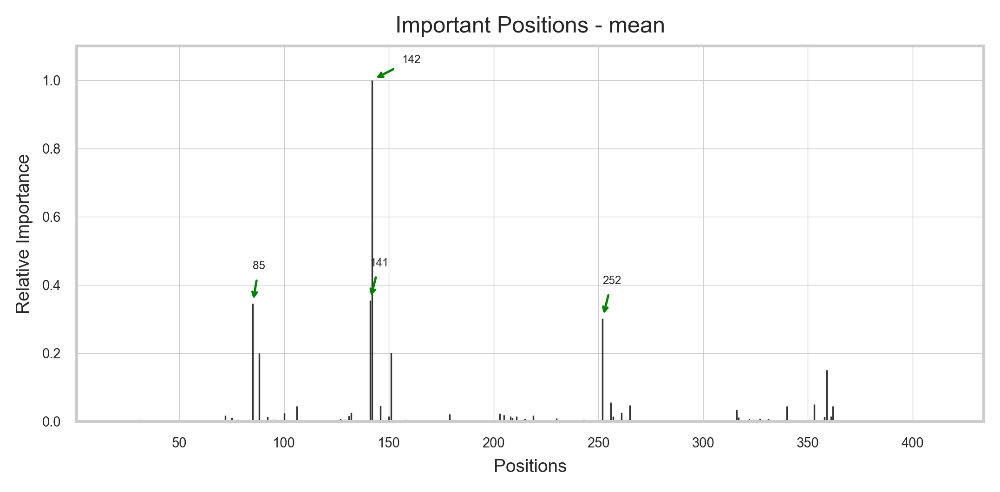

In [34]:
# merging the results for all the top models
mean_imp = ml.fimp_top_models(trained_models=top_models, model_names=model_names, 
                              train_cols=train_cols,grouped_features=dc,
                              n_positions=positions,report_dir=report_dir)

# lollipop plot for the merged results
viz.dp_plot(dat=mean_imp,figsize=(7.2, 3),
            model_name= 'mean',
            imp_col='mean_imp', 
            report_dir=report_dir)

{'p142': (<Figure size 1400x1400 with 1 Axes>,
  <AxesSubplot: title={'center': 'p142, P-value of KW test: 0.0'}, ylabel='Lambda_Max'>),
 'p252': (<Figure size 1400x1400 with 1 Axes>,
  <AxesSubplot: title={'center': 'p252, P-value of KW test: 0.0'}, ylabel='Lambda_Max'>),
 'p85': (<Figure size 1400x1400 with 1 Axes>,
  <AxesSubplot: title={'center': 'p85, P-value of KW test: 0.0'}, ylabel='Lambda_Max'>),
 'p141': (<Figure size 1400x1400 with 1 Axes>,
  <AxesSubplot: title={'center': 'p141, P-value of KW test: 0.0'}, ylabel='Lambda_Max'>),
 'p316': (<Figure size 1400x1400 with 1 Axes>,
  <AxesSubplot: title={'center': 'p316, P-value of KW test: 0.0'}, ylabel='Lambda_Max'>),
 'p359': (<Figure size 1400x1400 with 1 Axes>,
  <AxesSubplot: title={'center': 'p359, P-value of KW test: 0.0'}, ylabel='Lambda_Max'>),
 'p353': (<Figure size 1400x1400 with 1 Axes>,
  <AxesSubplot: title={'center': 'p353, P-value of KW test: 0.003'}, ylabel='Lambda_Max'>),
 'p132': (<Figure size 1400x1400 with 1 A

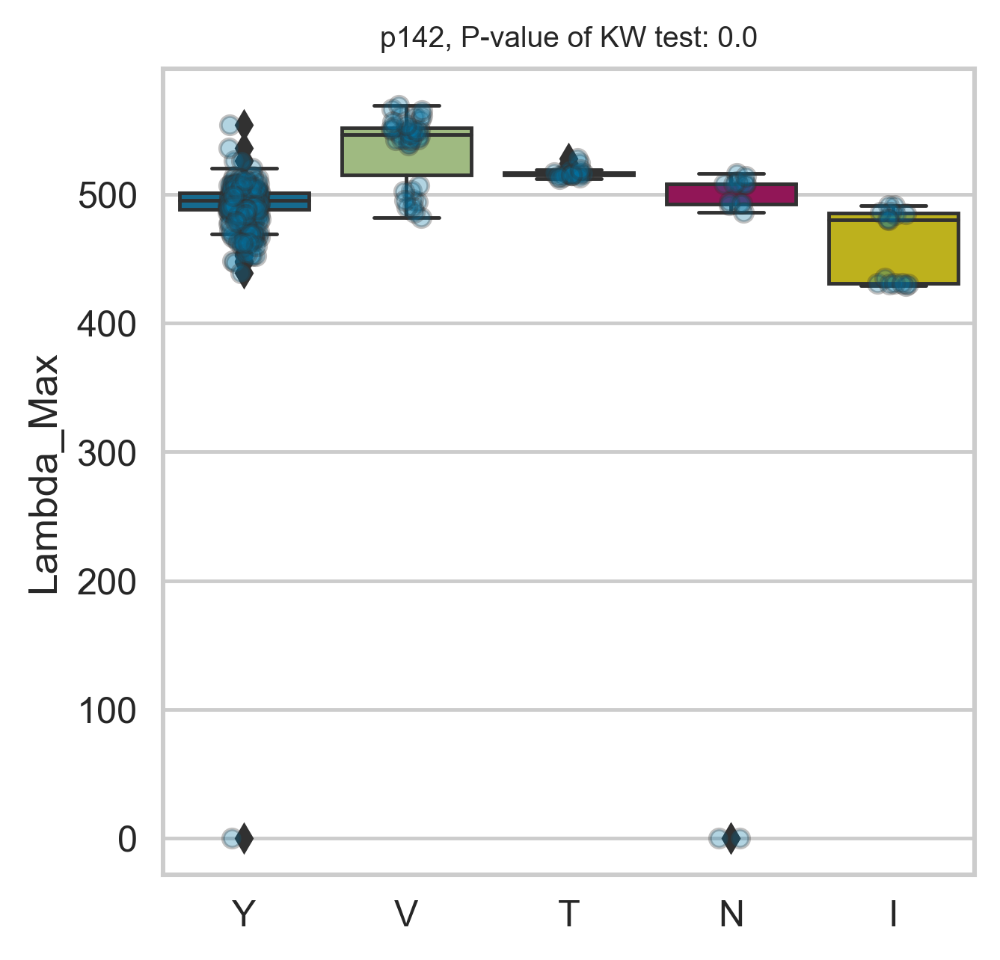

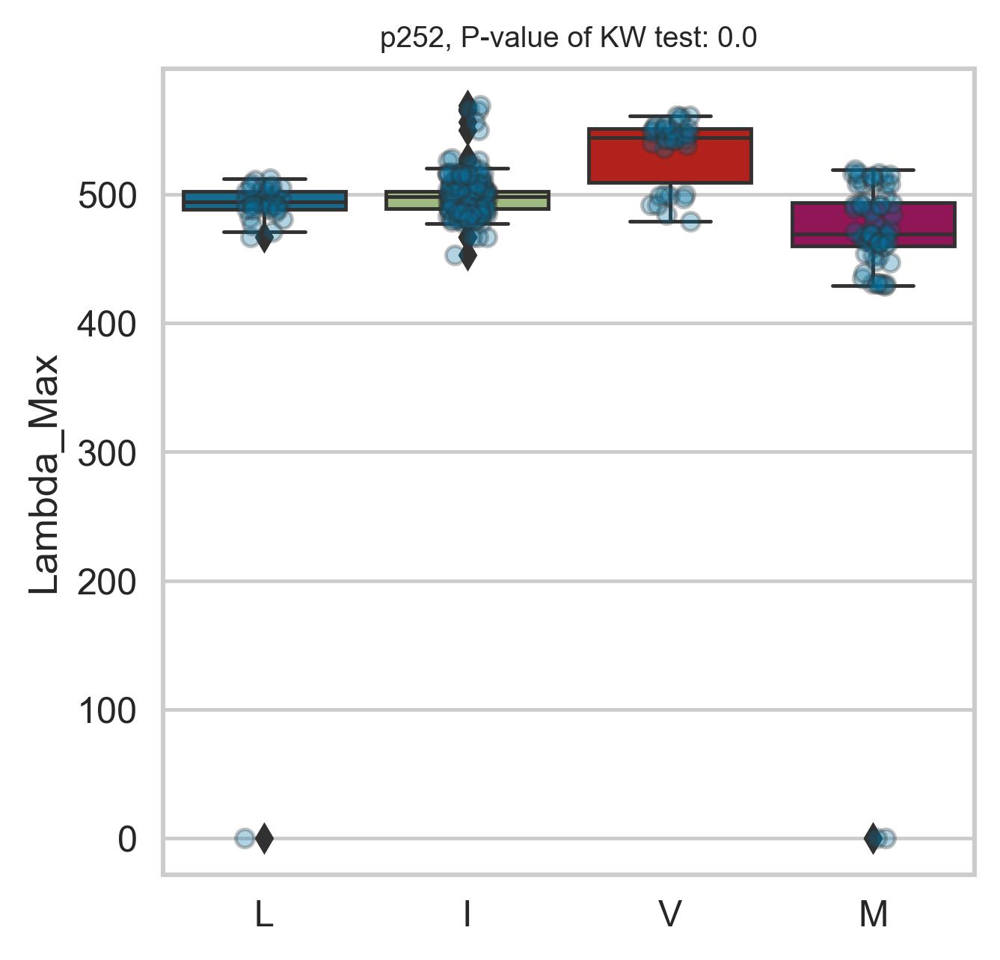

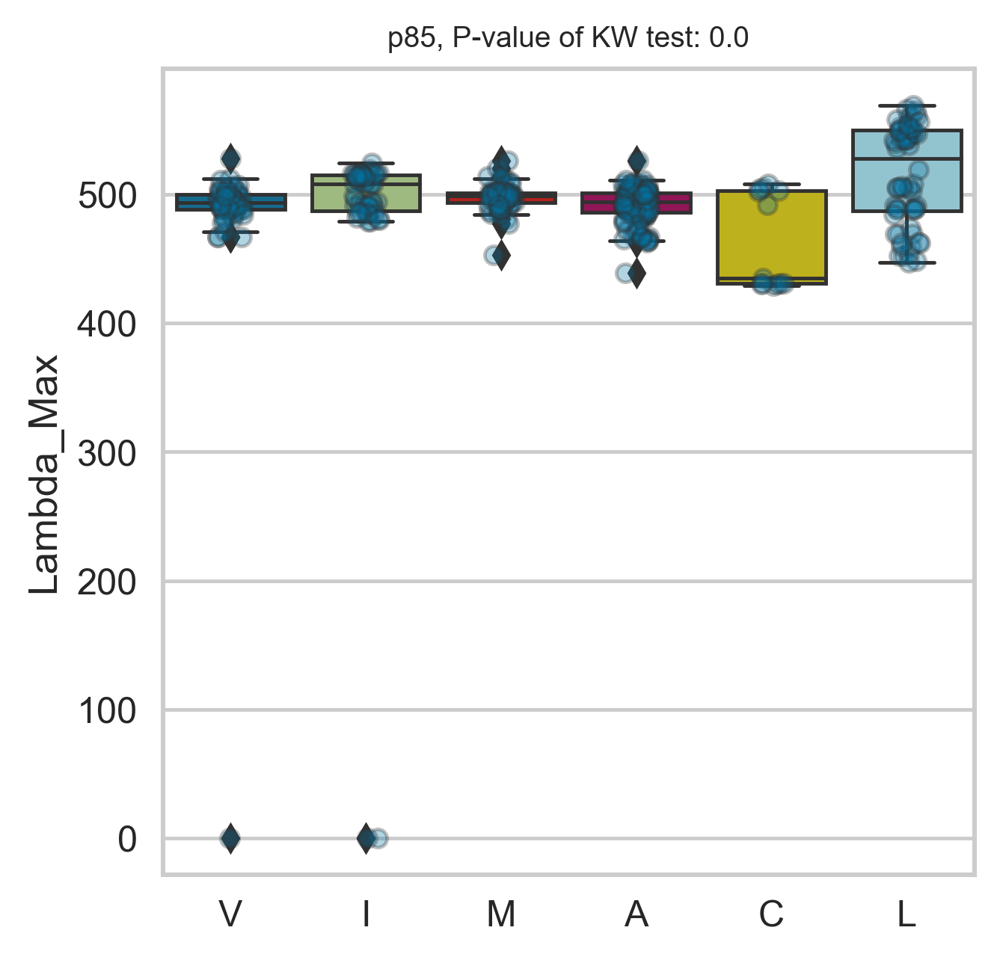

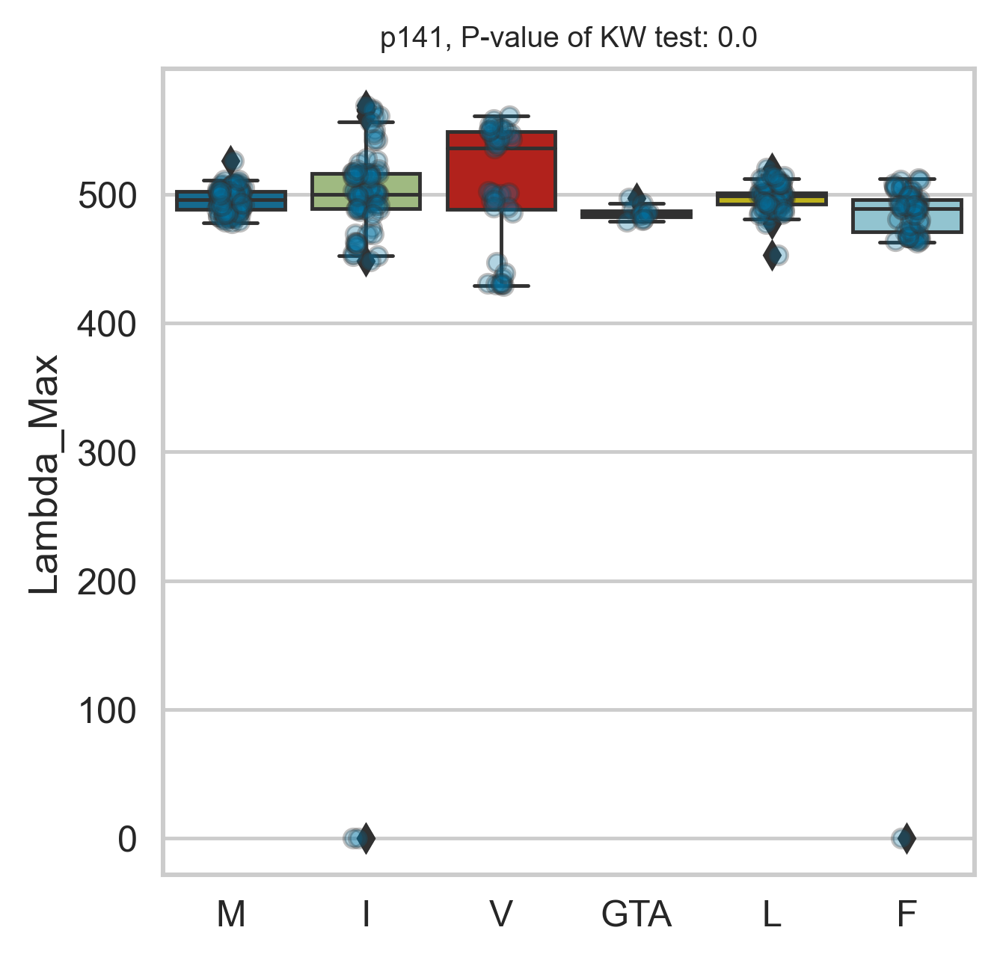

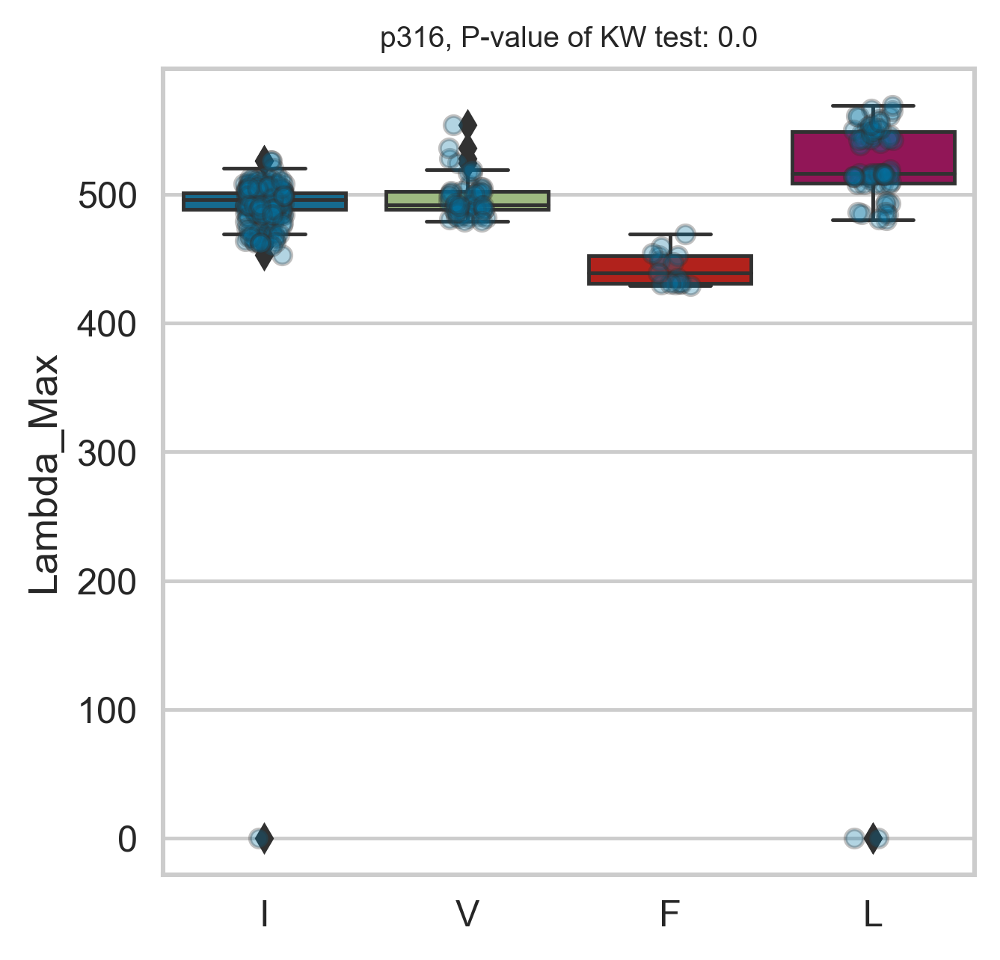

...

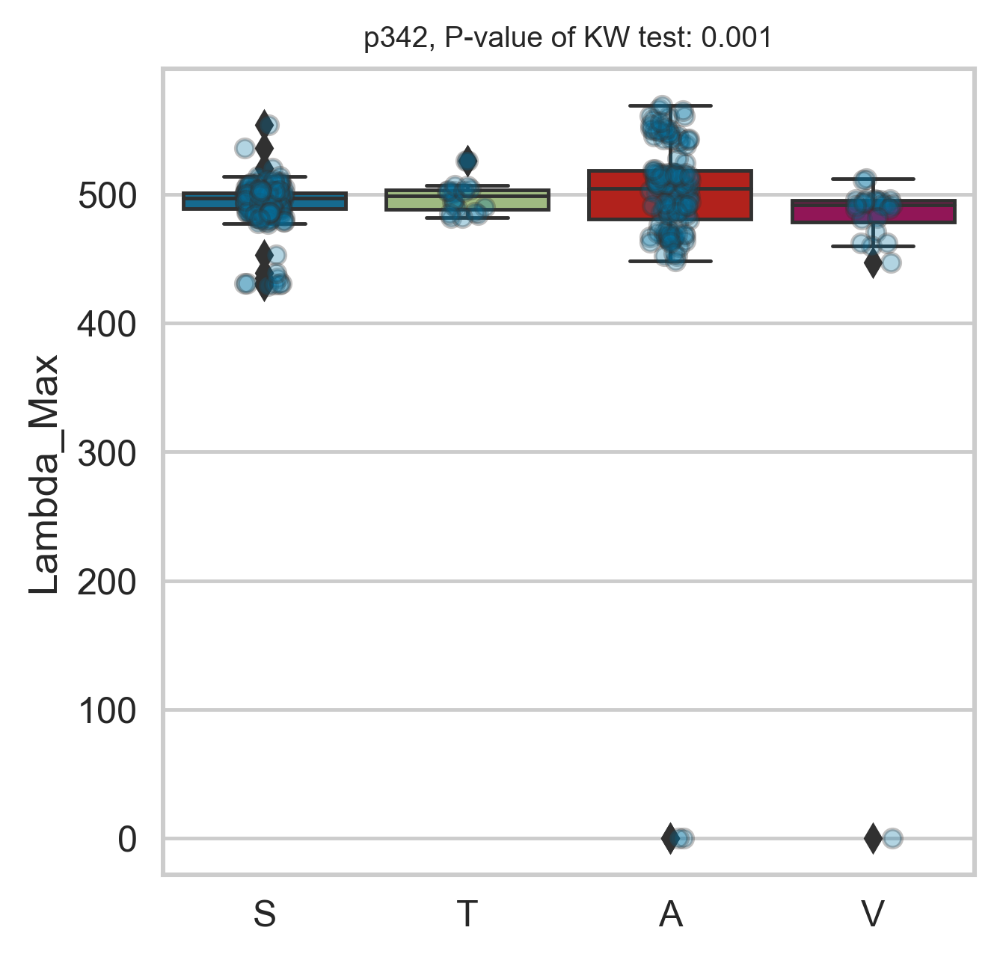

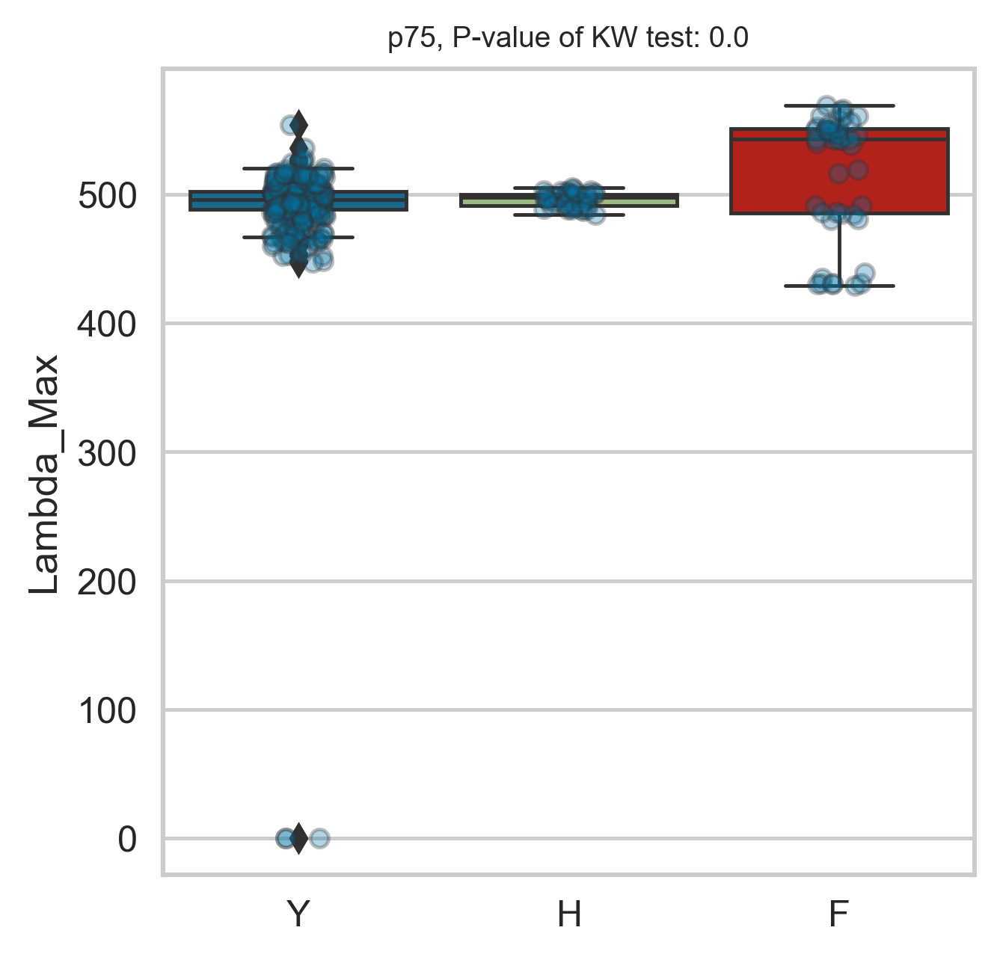

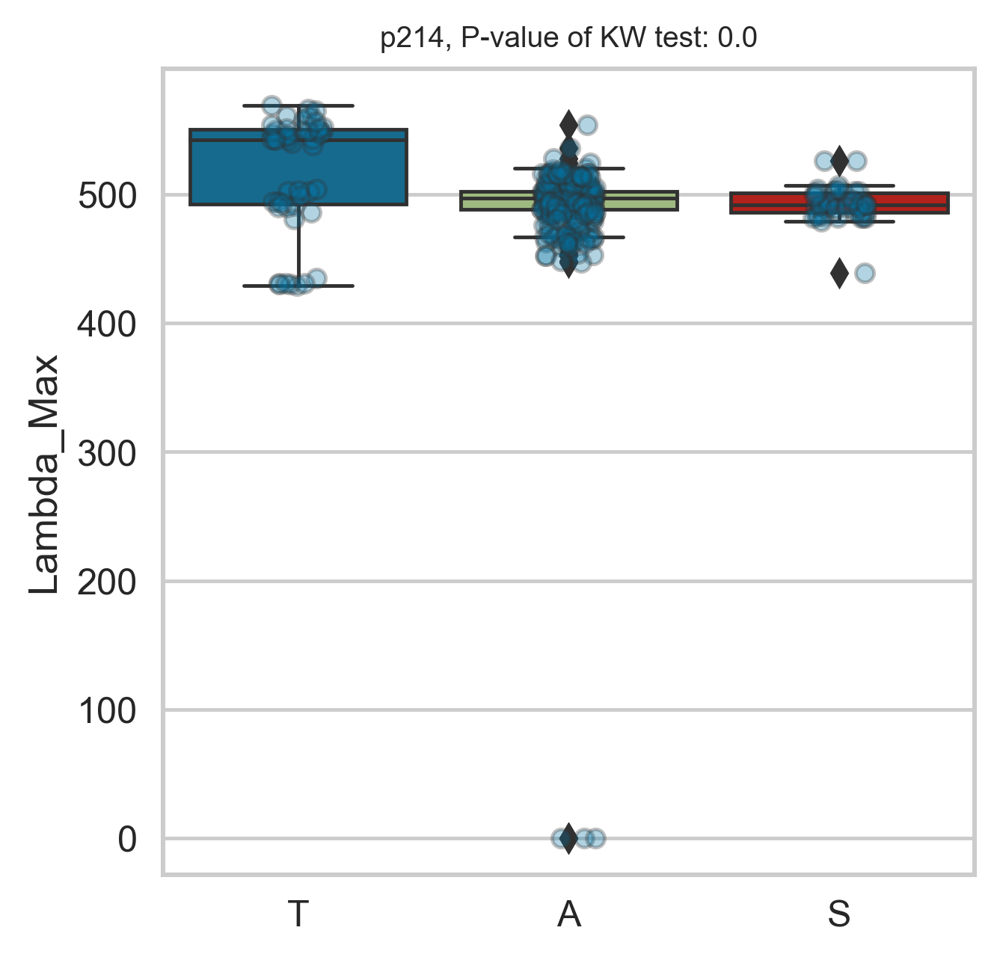

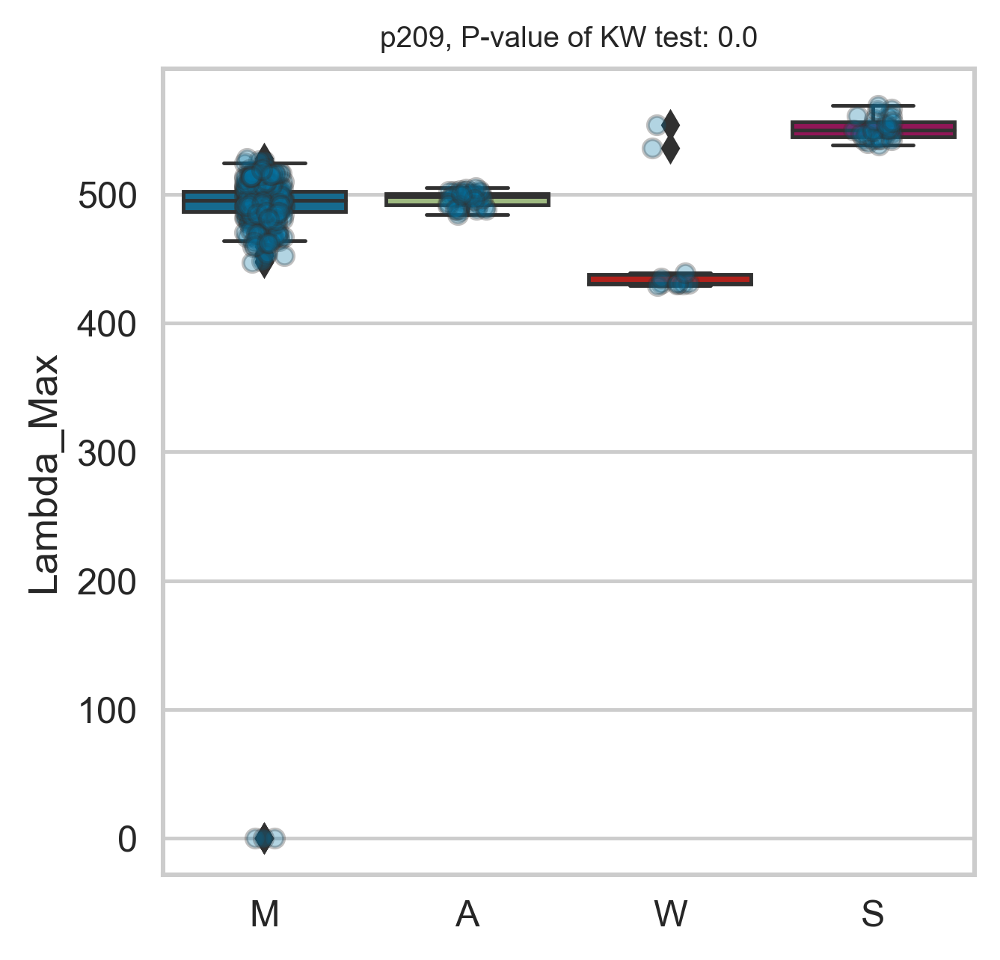

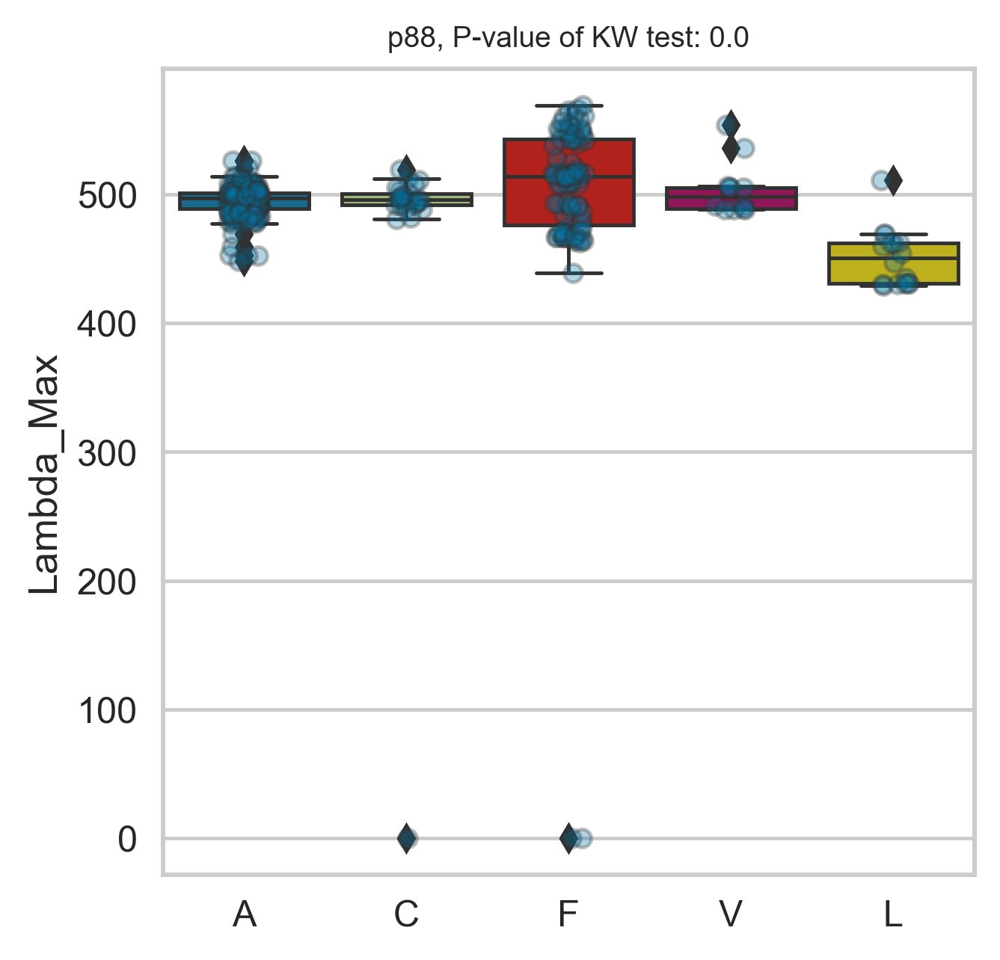

In [35]:
# visualizing top positions  
viz.plot_imp_all(trained_models=top_models, dat=df, train_cols=train_cols,
                 grouped_features=dc, meta_var=mt, model_type=anaType,
                 n_positions=positions, report_dir=report_dir)